In [1]:
!pip install kagglehub

### Download PCB Dataset from kaggle

In [2]:
import kagglehub

path = kagglehub.dataset_download("akhatova/pcb-defects")

print("Path to dataset files:", path)

Path to dataset files: /Users/devadarshini/.cache/kagglehub/datasets/akhatova/pcb-defects/versions/1


### Define base directory and paths

In [3]:
BASE_PATH = "/Users/devadarshini/.cache/kagglehub/datasets/akhatova/pcb-defects/versions/1/PCB_DATASET"

In [4]:
import os

IMAGE_DIR = os.path.join(BASE_PATH, "images")
ANNOT_DIR = os.path.join(BASE_PATH, "Annotations")

print("Image folders:", os.listdir(IMAGE_DIR))
print("Annotation folders:", os.listdir(ANNOT_DIR))

Image folders: ['Mouse_bite', 'Spur', 'Short', 'Spurious_copper', 'Open_circuit', 'Missing_hole']
Annotation folders: ['Mouse_bite', '.DS_Store', 'Spur', 'Short', 'Spurious_copper', 'Open_circuit', 'Missing_hole']


### Explore the dataset

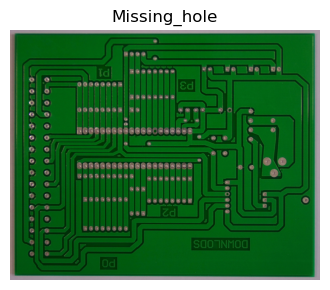

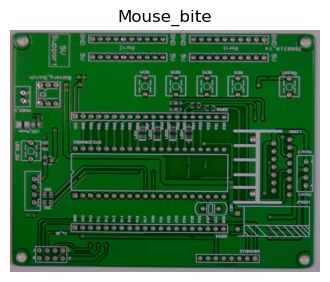

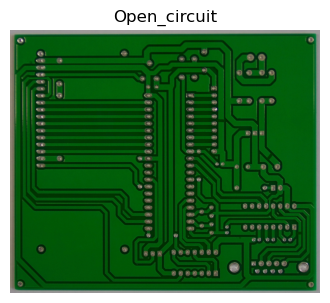

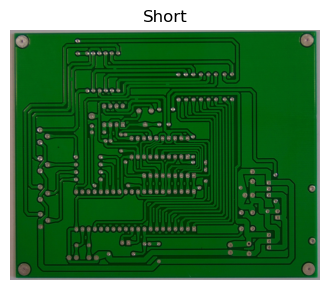

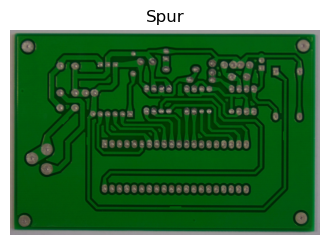

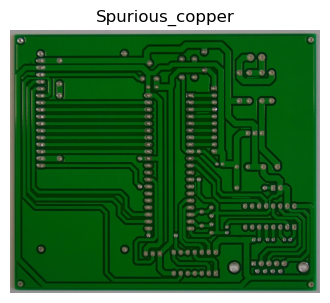

In [5]:
import cv2
import matplotlib.pyplot as plt
import random

classes = sorted([cls for cls in os.listdir(IMAGE_DIR) if not cls.startswith('.')])

for cls in classes:
    img_folder = os.path.join(IMAGE_DIR, cls)
    img_file = random.choice(os.listdir(img_folder))
    img_path = os.path.join(img_folder, img_file)

    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    plt.figure(figsize=(4, 4))
    plt.imshow(img)
    plt.title(cls)
    plt.axis("off")
    plt.show()

### Visualize an image along with its annotated bounding boxes

In [6]:
import xml.etree.ElementTree as ET

def plot_image_with_boxes(image_dir, annot_dir, class_name, file_name):
    img_path = os.path.join(image_dir, class_name, file_name)
    annot_path = os.path.join(annot_dir, class_name, file_name.replace('.jpg', '.xml'))
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    tree = ET.parse(annot_path)
    root = tree.getroot()

    for obj in root.findall('object'):
        label = obj.find('name').text
        bbox = obj.find('bndbox')
        xmin = int(bbox.find('xmin').text)
        ymin = int(bbox.find('ymin').text)
        xmax = int(bbox.find('xmax').text)
        ymax = int(bbox.find('ymax').text)
        cv2.rectangle(img, (xmin, ymin), (xmax, ymax), (255, 0, 0), 2)
        cv2.putText(img, label, (xmin, ymin - 10),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 0, 0), 2)

    plt.figure(figsize=(10, 8))
    plt.imshow(img)
    plt.axis("off")
    plt.title(f"{class_name} — {file_name}")
    plt.show()

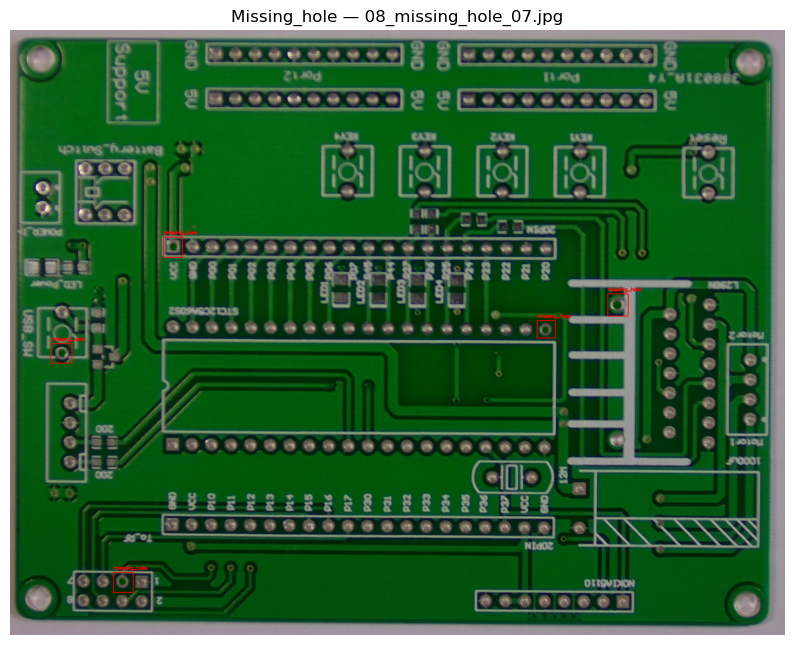

In [7]:
plot_image_with_boxes(
    image_dir=IMAGE_DIR,
    annot_dir=ANNOT_DIR,
    class_name="Missing_hole",
    file_name="08_missing_hole_07.jpg"
)

In [8]:
import shutil
from sklearn.model_selection import train_test_split

YOLO_BASE = os.path.expanduser("~/Desktop/YOLO_PCB")
YOLO_IMG_DIR = os.path.join(YOLO_BASE, "images")
YOLO_LABEL_DIR = os.path.join(YOLO_BASE, "labels")

class_names = ['Missing_hole', 'Mouse_bite', 'Open_circuit', 'Short', 'Spur', 'Spurious_copper']
class_dict = {name.lower(): i for i, name in enumerate(class_names)}

### Split Data into Train and Validation Sets

In [9]:
for split in ['train', 'val']:
    os.makedirs(os.path.join(YOLO_IMG_DIR, split), exist_ok=True)
    os.makedirs(os.path.join(YOLO_LABEL_DIR, split), exist_ok=True)

image_files = []
for cls in class_names:
    cls_dir = os.path.join(IMAGE_DIR, cls)
    for f in os.listdir(cls_dir):
        if f.endswith(".jpg"):
            image_files.append((cls, f))

train_set, val_set = train_test_split(image_files, test_size=0.2, random_state=42)

### Convert XML Annotations to YOLO Format

In [10]:
def convert_annotation(xml_path, img_shape, out_txt):
    tree = ET.parse(xml_path)
    root = tree.getroot()
    h, w = img_shape

    with open(out_txt, 'w') as f:
        for obj in root.findall('object'):
            cls = obj.find('name').text.lower()
            if cls not in class_dict:
                continue
            cls_id = class_dict[cls]
            bbox = obj.find('bndbox')
            xmin = int(bbox.find('xmin').text)
            ymin = int(bbox.find('ymin').text)
            xmax = int(bbox.find('xmax').text)
            ymax = int(bbox.find('ymax').text)

            x_center = ((xmin + xmax) / 2) / w
            y_center = ((ymin + ymax) / 2) / h
            width = (xmax - xmin) / w
            height = (ymax - ymin) / h
            f.write(f"{cls_id} {x_center:.6f} {y_center:.6f} {width:.6f} {height:.6f}\n")

def process_set(dataset, split):
    for cls, fname in dataset:
        src_img = os.path.join(IMAGE_DIR, cls, fname)
        src_xml = os.path.join(ANNOT_DIR, cls, fname.replace(".jpg", ".xml"))
        dst_img = os.path.join(YOLO_IMG_DIR, split, fname)
        dst_lbl = os.path.join(YOLO_LABEL_DIR, split, fname.replace(".jpg", ".txt"))

        shutil.copyfile(src_img, dst_img)
        img = cv2.imread(src_img)
        h, w, _ = img.shape
        convert_annotation(src_xml, (h, w), dst_lbl)

process_set(train_set, "train")
process_set(val_set, "val")

print("YOLO-compatible dataset created at:", YOLO_BASE)

YOLO-compatible dataset created at: /Users/devadarshini/Desktop/YOLO_PCB


### Generate data.yaml File for YOLOv5

In [11]:
import yaml

data_yaml = {
    'train': os.path.join(YOLO_IMG_DIR, 'train'),
    'val': os.path.join(YOLO_IMG_DIR, 'val'),
    'nc': 6,
    'names': class_names
}

with open(os.path.join(YOLO_BASE, "data.yaml"), "w") as f:
    yaml.dump(data_yaml, f)

print("data.yaml created at:", os.path.join(YOLO_BASE, "data.yaml"))


data.yaml created at: /Users/devadarshini/Desktop/YOLO_PCB/data.yaml


In [12]:
!git clone https://github.com/ultralytics/yolov5.git
%cd yolov5
!pip install -r requirements.txt

fatal: destination path 'yolov5' already exists and is not an empty directory.
/Users/devadarshini/Desktop/yolov5


###  Train YOLOv5

In [13]:
!python train.py \
  --img 640 \
  --batch 16 \
  --epochs 50 \
  --data /Users/devadarshini/Desktop/YOLO_PCB/data.yaml \
  --weights yolov5s.pt \
  --name pcb_yolov5

train: weights=yolov5s.pt, cfg=, data=/Users/devadarshini/Desktop/YOLO_PCB/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=50, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, evolve_population=data/hyps, resume_evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=pcb_yolov5, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest, ndjson_console=False, ndjson_file=False
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v7.0-419-gcd44191c Python-3.12.7 torch-2.5.1 CPU

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_p

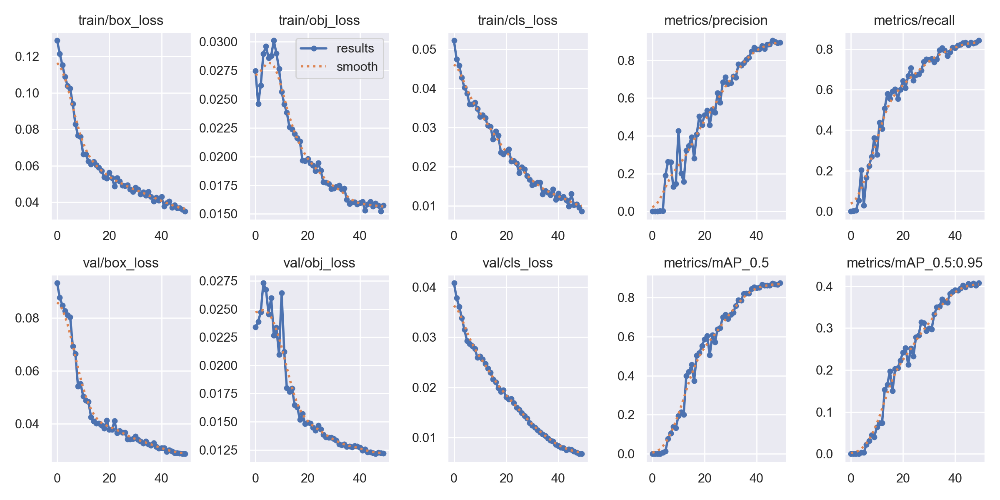

In [14]:
from IPython.display import Image
Image(filename='runs/train/pcb_yolov55/results.png', width=800)

#### The training and validation losses show a consistent downward trend, indicating stable model convergence. 
#### Precision and recall both exceed 0.8, demonstrating strong detection accuracy. 
#### The model shows reliable performance across various thresholds.

In [15]:
!python detect.py \
  --weights runs/train/pcb_yolov55/weights/best.pt \
  --img 640 \
  --conf 0.4 \
  --source /Users/devadarshini/Desktop/YOLO_PCB/images/val

detect: weights=['runs/train/pcb_yolov55/weights/best.pt'], source=/Users/devadarshini/Desktop/YOLO_PCB/images/val, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_format=0, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-419-gcd44191c Python-3.12.7 torch-2.5.1 CPU

Fusing layers... 
Model summary: 157 layers, 7026307 parameters, 0 gradients, 15.8 GFLOPs
image 1/139 /Users/devadarshini/Desktop/YOLO_PCB/images/val/01_missing_hole_01.jpg: 352x640 3 Missing_holes, 47.1ms
image 2/139 /Users/devadarshini/Desktop/YOLO_PCB/images/val/01_missing_hole_02.jpg: 352x640 3 Missing_holes, 39.6ms
image 3/139 /Users/devadarshini/Desktop/YOLO_PCB/images/val/01_missing_hole_03

### Runs detection on validation images and saved in runs/detect/exp2

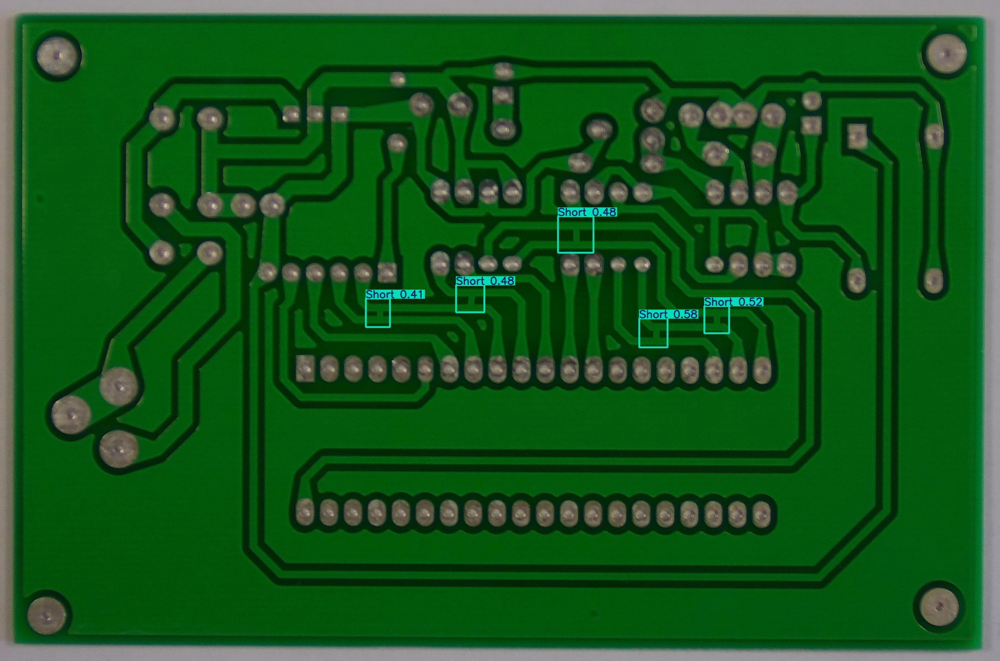

In [16]:
import os
from PIL import Image
import random

pred_dir = "runs/detect/exp"
sample_img = random.choice(os.listdir(pred_dir))
Image.open(os.path.join(pred_dir, sample_img))

In [18]:
!python val.py \
  --weights runs/train/pcb_yolov55/weights/best.pt \
  --data /Users/devadarshini/Desktop/YOLO_PCB/data.yaml \
  --img 640 \
  --task val \
  --save-conf \
  --name eval_clean_run

val: data=/Users/devadarshini/Desktop/YOLO_PCB/data.yaml, weights=['runs/train/pcb_yolov55/weights/best.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.6, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=True, save_json=False, project=runs/val, name=eval_clean_run, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v7.0-419-gcd44191c Python-3.12.7 torch-2.5.1 CPU

Fusing layers... 
Model summary: 157 layers, 7026307 parameters, 0 gradients, 15.8 GFLOPs
val: Scanning /Users/devadarshini/Desktop/YOLO_PCB/labels/val.cache... 139 image
                 Class     Images  Instances          P          R      mAP50   
                   all        139        582      0.894      0.843      0.875      0.407
          Missing_hole        139        113      0.986      0.991      0.992      0.545
            Mouse_bite        139        105      0.838      0.667      0.726      0.324
          Open_ci

In [19]:
!python detect.py \
  --weights runs/train/pcb_yolov55/weights/best.pt \
  --source /Users/devadarshini/Desktop/YOLO_PCB/images/val \
  --conf 0.4 \
  --save-txt \
  --project runs/detect \
  --name final_inference \
  --exist-ok

detect: weights=['runs/train/pcb_yolov55/weights/best.pt'], source=/Users/devadarshini/Desktop/YOLO_PCB/images/val, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_format=0, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=final_inference, exist_ok=True, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-419-gcd44191c Python-3.12.7 torch-2.5.1 CPU

Fusing layers... 
Model summary: 157 layers, 7026307 parameters, 0 gradients, 15.8 GFLOPs
image 1/139 /Users/devadarshini/Desktop/YOLO_PCB/images/val/01_missing_hole_01.jpg: 352x640 3 Missing_holes, 37.8ms
image 2/139 /Users/devadarshini/Desktop/YOLO_PCB/images/val/01_missing_hole_02.jpg: 352x640 3 Missing_holes, 36.0ms
image 3/139 /Users/devadarshini/Desktop/YOLO_PCB/images/val/01_missi

### Define class severity weights and class label mapping

In [20]:
import os
import cv2
import matplotlib.pyplot as plt
severity_weights = {
    'Missing_hole': 5,
    'Mouse_bite': 4,
    'Open_circuit': 5,
    'Short': 5,
    'Spur': 3,
    'Spurious_copper': 2
}

class_id_to_label = {
    0: 'Missing_hole',
    1: 'Mouse_bite',
    2: 'Open_circuit',
    3: 'Short',
    4: 'Spur',
    5: 'Spurious_copper'
}


In [21]:
image_dir = "runs/detect/final_inference"
label_dir = os.path.join(image_dir, "labels")

### Visualize bounding boxes and class labels on image

In [22]:
def visualize_image_with_boxes(image_path, label_path):
    image = cv2.imread(image_path)
    h, w = image.shape[:2]

    if not os.path.exists(label_path):
        print(f"No label for: {image_path}")
        return

    with open(label_path, "r") as f:
        for line in f.readlines():
            parts = line.strip().split()
            cls_id = int(parts[0])
            cx, cy, bw, bh = map(float, parts[1:])
            
            x1 = int((cx - bw / 2) * w)
            y1 = int((cy - bh / 2) * h)
            x2 = int((cx + bw / 2) * w)
            y2 = int((cy + bh / 2) * h)

            label = class_id_to_label.get(cls_id, str(cls_id))
            cv2.rectangle(image, (x1, y1), (x2, y2), (0, 0, 255), 2)
            cv2.putText(image, label, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (36, 255, 12), 2)

    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(10, 8))
    plt.imshow(image)
    plt.axis("off")
    plt.title(os.path.basename(image_path))
    plt.show()


### Compute severity score based on class-specific weights

In [23]:
def compute_severity_score(label_path):
    score = 0
    if not os.path.exists(label_path):
        return score

    with open(label_path, "r") as f:
        for line in f:
            cls_id = int(line.strip().split()[0])
            label = class_id_to_label.get(cls_id, str(cls_id))
            score += severity_weights.get(label, 1)
    return score

--- 01_missing_hole_01.jpg ---
Severity Score: 30


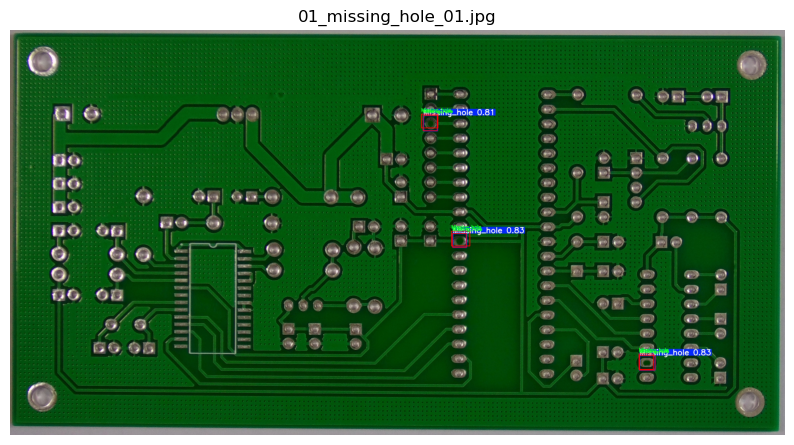

--- 01_missing_hole_02.jpg ---
Severity Score: 30


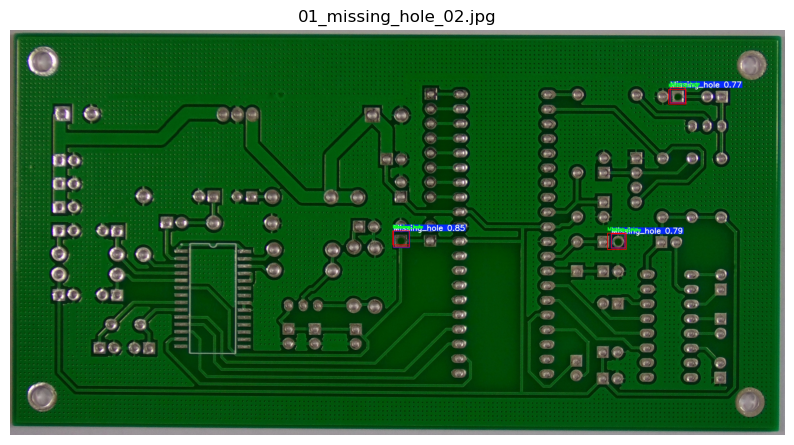

--- 01_missing_hole_03.jpg ---
Severity Score: 30


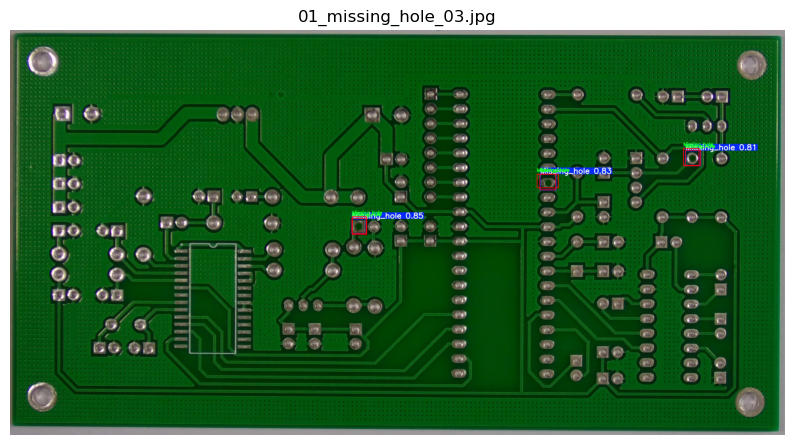

--- 01_missing_hole_04.jpg ---
Severity Score: 25


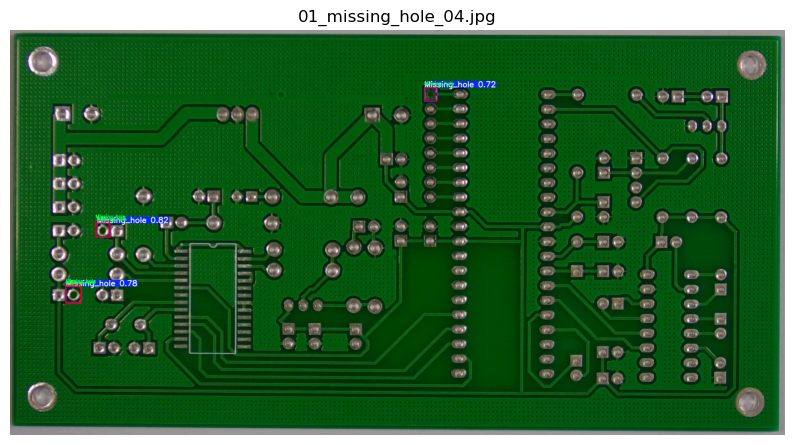

--- 01_missing_hole_15.jpg ---
Severity Score: 30


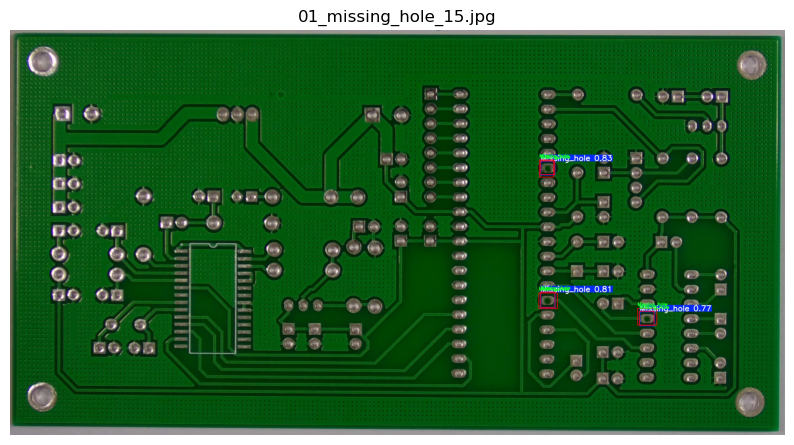

In [24]:
count = 0
for filename in sorted(os.listdir(image_dir)):
    if filename.endswith(".jpg") or filename.endswith(".png"):
        img_path = os.path.join(image_dir, filename)
        label_path = os.path.join(label_dir, os.path.splitext(filename)[0] + ".txt")
        
        print(f"--- {filename} ---")
        severity = compute_severity_score(label_path)
        print(f"Severity Score: {severity}")
        visualize_image_with_boxes(img_path, label_path)

        count += 1
        if count >= 5:
            break

### GUI for PCB Defect Detection using YOLOv5

In [25]:
import tkinter as tk
from tkinter import filedialog
import torch
import cv2
from PIL import Image, ImageTk
import os

MODEL_PATH = "/Users/devadarshini/Desktop/yolov5/runs/train/pcb_yolov55/weights/best.pt"
assert os.path.exists(MODEL_PATH), f"Model not found at {MODEL_PATH}"
model = torch.hub.load('ultralytics/yolov5', 'custom', path=MODEL_PATH, force_reload=True)
model.conf = 0.25

class_names = ['Missing_hole', 'Mouse_bite', 'Open_circuit', 'Short', 'Spur', 'Spurious_copper']
severity_weights = {
    'Missing_hole': 5,
    'Mouse_bite': 4,
    'Open_circuit': 5,
    'Short': 5,
    'Spur': 3,
    'Spurious_copper': 2
}

def resize_image_keep_aspect(img_pil, base_width=800):
    w_percent = (base_width / float(img_pil.size[0]))
    h_size = int((float(img_pil.size[1]) * float(w_percent)))
    return img_pil.resize((base_width, h_size), Image.LANCZOS)
def detect_image():
    file_path = filedialog.askopenfilename(title="Select PCB Image")
    if not file_path:
        return

    results = model(file_path)
    detections = results.xyxy[0]

    print(f"\nDetections for {os.path.basename(file_path)}:")
    print(detections)

    image = cv2.imread(file_path)
    h, w = image.shape[:2]
    total_score = 0

    for *xyxy, conf, cls_id in detections:
        x1, y1, x2, y2 = map(int, xyxy)
        defect_name = class_names[int(cls_id)]
        severity = severity_weights.get(defect_name, 1)
        total_score += severity

        label = f"{defect_name} (Severity {severity})"
        cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)
        cv2.putText(image, label, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX,
                    0.6, (0, 0, 255), 2)

    cv2.putText(image, f"Total Severity Score: {total_score}", (10, 30),
                cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255, 255, 255), 2)

    img_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    img_pil = Image.fromarray(img_rgb)
    img_pil = resize_image_keep_aspect(img_pil)

    img_tk = ImageTk.PhotoImage(img_pil)
    canvas.config(width=img_pil.width, height=img_pil.height)
    canvas.create_image(0, 0, anchor="nw", image=img_tk)
    canvas.image = img_tk

root = tk.Tk()
root.title("PCB Defect Detection & Severity Scoring")

btn = tk.Button(root, text="Select PCB Image", command=detect_image, font=("Arial", 14), bg="#4CAF50", fg="white")
btn.pack(pady=10)

canvas = tk.Canvas(root)
canvas.pack()

root.mainloop()

Downloading: "https://github.com/ultralytics/yolov5/zipball/master" to /Users/devadarshini/.cache/torch/hub/master.zip
YOLOv5 🚀 2025-5-31 Python-3.12.7 torch-2.5.1 CPU

Fusing layers... 
Model summary: 157 layers, 7026307 parameters, 0 gradients, 15.8 GFLOPs
Adding AutoShape... 
/Users/devadarshini/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):



Detections for 01_mouse_bite_04.jpg:
tensor([[2.59679e+03, 8.79029e+02, 2.62781e+03, 9.26953e+02, 2.69836e-01, 1.00000e+00]])


/Users/devadarshini/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):



Detections for 04_mouse_bite_09.jpg:
tensor([[1.68421e+03, 1.50271e+03, 1.73694e+03, 1.56762e+03, 5.02315e-01, 2.00000e+00],
        [1.96663e+03, 1.36074e+03, 2.02673e+03, 1.44923e+03, 4.79830e-01, 4.00000e+00],
        [1.11595e+03, 1.49269e+03, 1.17831e+03, 1.56424e+03, 4.56224e-01, 2.00000e+00],
        [1.96195e+03, 1.35815e+03, 2.02764e+03, 1.45008e+03, 4.43635e-01, 1.00000e+00],
        [1.11781e+03, 1.49556e+03, 1.17688e+03, 1.56445e+03, 4.29711e-01, 1.00000e+00],
        [1.68642e+03, 1.50137e+03, 1.73702e+03, 1.56930e+03, 3.33375e-01, 1.00000e+00]])


/Users/devadarshini/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):



Detections for 05_short_10.jpg:
tensor([[1.48977e+03, 2.60490e+02, 1.58273e+03, 3.48747e+02, 4.69245e-01, 3.00000e+00],
        [1.11902e+03, 3.77301e+02, 1.21028e+03, 4.66231e+02, 3.54220e-01, 3.00000e+00],
        [1.31666e+03, 1.69455e+03, 1.37031e+03, 1.75666e+03, 3.07411e-01, 4.00000e+00]])
